In [45]:
#importing all necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.model_selection import train_test_split, cross_val_score,KFold
from sklearn.preprocessing import LabelEncoder,OrdinalEncoder
from sklearn.impute import KNNImputer
import warnings
warnings.filterwarnings("ignore")

In [46]:
pd.set_option('display.max_rows', 10000)
pd.set_option('display.max_columns', 500)

In [47]:
#reading the data
df = pd.read_csv("zomato.csv")

In [48]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


### Droping url,address,name,phone,menu_item,reviews_list,dish_liked columns as they are not contributing much information in predicting the Cost

In [49]:
df.drop(["url","address","name","phone","menu_item","reviews_list","dish_liked"],axis=1,inplace=True)

In [50]:
df.head(5)

,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),listed_in(type),listed_in(city)
0,Yes,Yes,4.1/5,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800,Buffet,Banashankari
1,Yes,No,4.1/5,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800,Buffet,Banashankari
2,Yes,No,3.8/5,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800,Buffet,Banashankari
3,No,No,3.7/5,88,Banashankari,Quick Bites,"South Indian, North Indian",300,Buffet,Banashankari
4,No,No,3.8/5,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600,Buffet,Banashankari


In [51]:
#Checking the duplicate values in the dataset
df.duplicated().sum()

372

In [52]:
df[df.duplicated(keep=False)]

,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),listed_in(type),listed_in(city)
91,No,No,NaN,0,Banashankari,"Takeaway, Delivery",South Indian,400,Delivery,Banashankari
135,No,No,NaN,0,Banashankari,"Takeaway, Delivery",South Indian,400,Delivery,Banashankari
553,Yes,Yes,NEW,0,Banashankari,Casual Dining,"Continental, Asian, North Indian, Tea",500,Dine-out,Banashankari
596,Yes,Yes,NEW,0,Banashankari,Casual Dining,"Continental, Asian, North Indian, Tea",500,Dine-out,Banashankari
718,No,No,NaN,0,Banashankari,Quick Bites,Biryani,250,Dine-out,Banashankari
735,No,No,NaN,0,Banashankari,Quick Bites,South Indian,150,Dine-out,Banashankari
737,No,No,NEW,0,Banashankari,Quick Bites,South Indian,150,Dine-out,Banashankari
745,No,No,NaN,0,Banashankari,Quick Bites,Biryani,250,Dine-out,Banashankari
746,No,No,NaN,0,Banashankari,Quick Bites,South Indian,150,Dine-out,Banashankari
753,No,No,NEW,0,Banashankari,Quick Bites,South Indian,150,Dine-out,Banashankari


In [53]:
#Removing all the duplicates from the dataset
df.drop_duplicates(inplace=True)

In [54]:
df.duplicated().sum()

0

In [55]:
#Fetching rating out of 5 as rating stored as 4.1 / 5
df["rating"] = df["rate"].str.split("/").str.get(0)

In [56]:
df.drop("rate",axis=1,inplace=True)

In [57]:
df.head()

,online_order,book_table,votes,location,rest_type,cuisines,approx_cost(for two people),listed_in(type),listed_in(city),rating
0,Yes,Yes,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800,Buffet,Banashankari,4.1
1,Yes,No,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800,Buffet,Banashankari,4.1
2,Yes,No,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800,Buffet,Banashankari,3.8
3,No,No,88,Banashankari,Quick Bites,"South Indian, North Indian",300,Buffet,Banashankari,3.7
4,No,No,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600,Buffet,Banashankari,3.8


In [58]:
#Renaming the columns to their appropriate names
df.rename(columns={"approx_cost(for two people)":"Average Cost",
                   "listed_in(type)" : "Type of Order",
                   "rest_type" : "Type of Resturant",
                   "listed_in(city)" : "City Name"},inplace=True)

In [59]:
# Removing comma from the amount and stored as float values
df["Average Cost"] = df["Average Cost"].str.replace(",","")
df["Average Cost"] = df["Average Cost"].astype("float64")

In [60]:
df["rating"].unique()

array(['4.1', '3.8', '3.7', '3.6', '4.6', '4.0', '4.2', '3.9', '3.1',
       '3.0', '3.2', '3.3', '2.8', '4.4', '4.3', 'NEW', '2.9', '3.5', nan,
       '2.6', '3.8 ', '3.4', '4.5', '2.5', '2.7', '4.7', '2.4', '2.2',
       '2.3', '3.4 ', '-', '3.6 ', '4.8', '3.9 ', '4.2 ', '4.0 ', '4.1 ',
       '3.7 ', '3.1 ', '2.9 ', '3.3 ', '2.8 ', '3.5 ', '2.7 ', '2.5 ',
       '3.2 ', '2.6 ', '4.5 ', '4.3 ', '4.4 ', '4.9', '2.1', '2.0', '1.8',
       '4.6 ', '4.9 ', '3.0 ', '4.8 ', '2.3 ', '4.7 ', '2.4 ', '2.1 ',
       '2.2 ', '2.0 ', '1.8 '], dtype=object)

In [61]:
# Replacing the NEW rate value in rating by below formula
new_rate = (df["rating"].shape[0] / df[df["rating"] == "NEW"].shape[0])/5
new_rate = round(new_rate,1)
df["rating"]=np.where(df["rating"] == "NEW",new_rate,df["rating"])

In [62]:
# Replacing the "-" value in the rating by 0
df["rating"]=np.where(df["rating"] == "-",0,df["rating"])

In [63]:
#Converting the rating into float values
df["rating"] = df["rating"].astype("float64")

In [64]:
df.head()

,online_order,book_table,votes,location,Type of Resturant,cuisines,Average Cost,Type of Order,City Name,rating
0,Yes,Yes,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,Buffet,Banashankari,4.1
1,Yes,No,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,Buffet,Banashankari,4.1
2,Yes,No,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,Buffet,Banashankari,3.8
3,No,No,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,Buffet,Banashankari,3.7
4,No,No,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,Buffet,Banashankari,3.8


In [65]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51345 entries, 0 to 51716
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   online_order       51345 non-null  object 
 1   book_table         51345 non-null  object 
 2   votes              51345 non-null  int64  
 3   location           51326 non-null  object 
 4   Type of Resturant  51120 non-null  object 
 5   cuisines           51302 non-null  object 
 6   Average Cost       51004 non-null  float64
 7   Type of Order      51345 non-null  object 
 8   City Name          51345 non-null  object 
 9   rating             43825 non-null  float64
dtypes: float64(2), int64(1), object(7)
memory usage: 4.3+ MB


In [66]:
df.describe(include="all")

,online_order,book_table,votes,location,Type of Resturant,cuisines,Average Cost,Type of Order,City Name,rating
count,51345,51345,51345.000000,51326,51120,51302,51004.000000,51345,51345,43825.000000
unique,2,2,NaN,93,93,2723,NaN,7,30,NaN
top,Yes,No,NaN,BTM,Quick Bites,North Indian,NaN,Delivery,BTM,NaN
freq,30315,44929,NaN,5065,18881,2841,NaN,25767,3249,NaN
mean,NaN,NaN,284.726147,NaN,NaN,NaN,556.577425,NaN,NaN,3.743975
std,NaN,NaN,805.088397,NaN,NaN,NaN,439.203135,NaN,NaN,0.502942
min,NaN,NaN,0.000000,NaN,NaN,NaN,40.000000,NaN,NaN,0.000000
25%,NaN,NaN,7.000000,NaN,NaN,NaN,300.000000,NaN,NaN,3.400000
50%,NaN,NaN,42.000000,NaN,NaN,NaN,400.000000,NaN,NaN,3.800000
75%,NaN,NaN,200.000000,NaN,NaN,NaN,700.000000,NaN,NaN,4.100000


In [67]:
#checking the ul values in the dataset
df.isnull().sum()

online_order            0
book_table              0
votes                   0
location               19
Type of Resturant     225
cuisines               43
Average Cost          341
Type of Order           0
City Name               0
rating               7520
dtype: int64

In [68]:
# Checking the percentage of null values in each column
(df.isnull().sum() / df.shape[0]) * 100

online_order          0.000000
book_table            0.000000
votes                 0.000000
location              0.037005
Type of Resturant     0.438212
cuisines              0.083747
Average Cost          0.664135
Type of Order         0.000000
City Name             0.000000
rating               14.646022
dtype: float64

#### We found Rating has maximum number of Null values. We need to impute them in the feature engineering stage

Text(0.5, 1.0, 'Resturant taking online order or not')

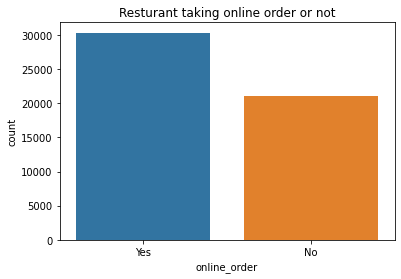

In [69]:
#Calculating how many people orders online
sns.countplot(df["online_order"])
plt.title("Resturant taking online order or not")

#### There are around 30000 Resturants who are accepting online orders and around 21000 Resturants who are taking offline orders 

Text(0.5, 1.0, 'Restaurants allowing table booking or not')

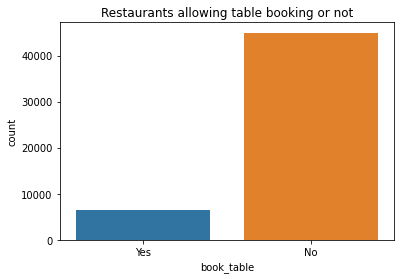

In [70]:
#Checking how many people books table
sns.countplot(df["book_table"])
plt.title("Restaurants allowing table booking or not")

#### There are around 47000 Resturants who are allowing booking tables and around 4000 Resturants who are not allowing booking table

Text(0.5, 1.0, 'Number of Resturants in each City')

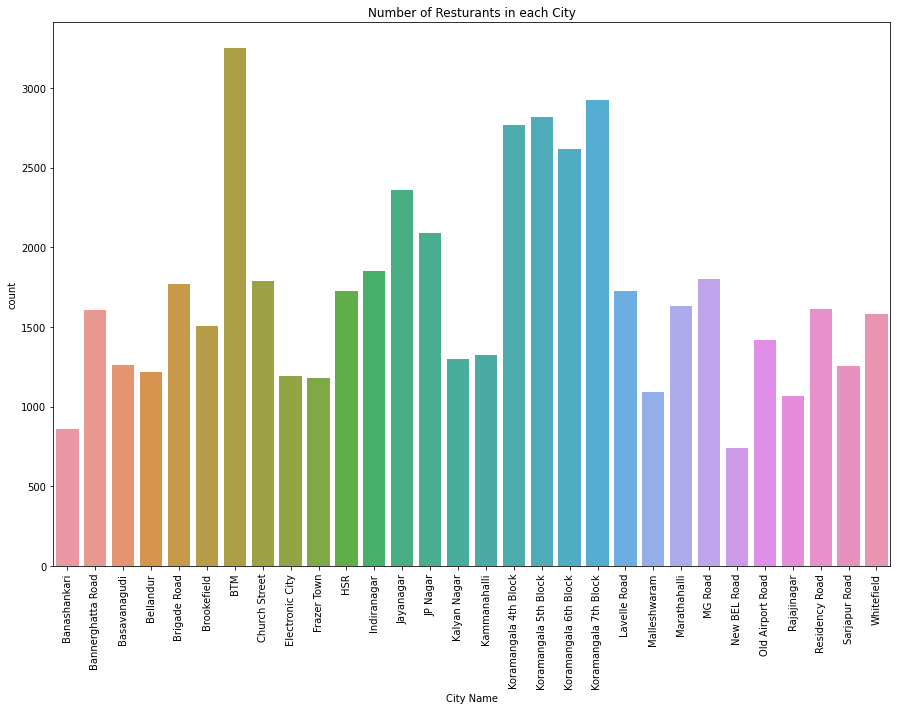

In [71]:
#Number of resturants in each city
plt.figure(figsize=(15,10))
sns.countplot(df["City Name"])
plt.xticks(rotation=90)
plt.title("Number of Resturants in each City")

#### Most Number of Resturants are in the BTM city and least number of Resturants are in New BEL Road

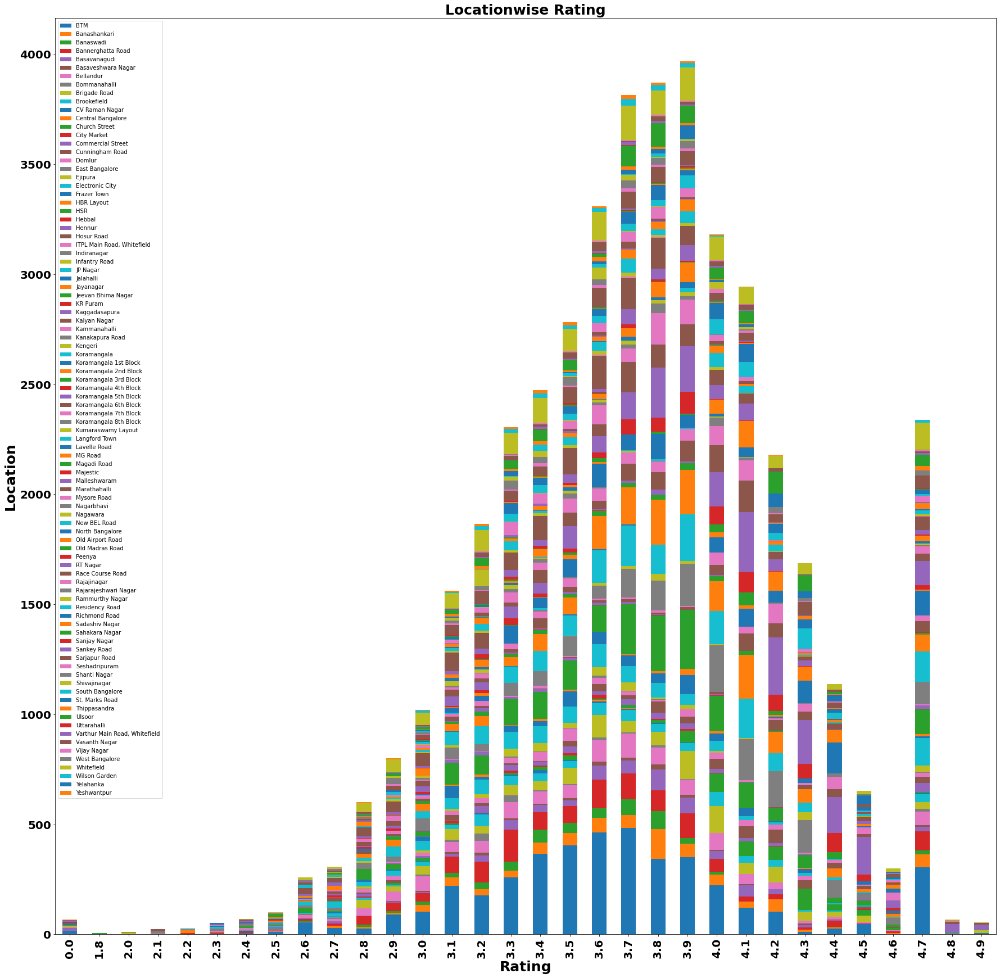

In [72]:
#Plotting Location wise rating
pd.crosstab(df["rating"],df["location"]).plot(kind="bar",figsize=(30,30),stacked=True)
plt.ylabel('Location',fontsize=25,fontweight='bold')
plt.xlabel('Rating',fontsize=25,fontweight='bold')
plt.xticks(fontsize=20,fontweight='bold')
plt.yticks(fontsize=20,fontweight='bold')
plt.title("Locationwise Rating",fontsize=25,fontweight='bold')
plt.legend()

#### We see that we have most resturants of 3.9 Rating and we also see we have very few resturants of 4.8 and 4.9 Ratings

In [73]:
#Plotting total average cost for each type of resturant
px.histogram(df,x="Type of Resturant",y="Average Cost")

#### It seems like the total average cost for Casual Dinning is very high as comparison to other types of resturants

In [74]:
#Plotting total average cost in each location
plt.figure(figsize=(20,20))
fig = px.pie(df,values="Average Cost",names="location",height=3000)
fig.show()

<Figure size 1440x1440 with 0 Axes>

#### The highest average cost of eating is in BTM location among all locations and this is because the most number of restuarants in BTM city

In [75]:
#Plotting sum of average cost for each type of service
px.histogram(df,x="Type of Order",y="Average Cost",title="Average cost for each type of service")

#### From the above graph it is clear that Zomatois greatly benefited from Delivery mode service as customers love to eat in home rather than going out to eat

In [76]:
px.histogram(df,x="online_order",y="Average Cost",title="Average cost if customer is ordering online or not",width=500)

In [80]:
px.histogram(df,x="cuisines",y="Average Cost",width=10000,height=1000)

#### The highest average cost is for North Indian Cuisine

<AxesSubplot:xlabel='votes', ylabel='Average Cost'>

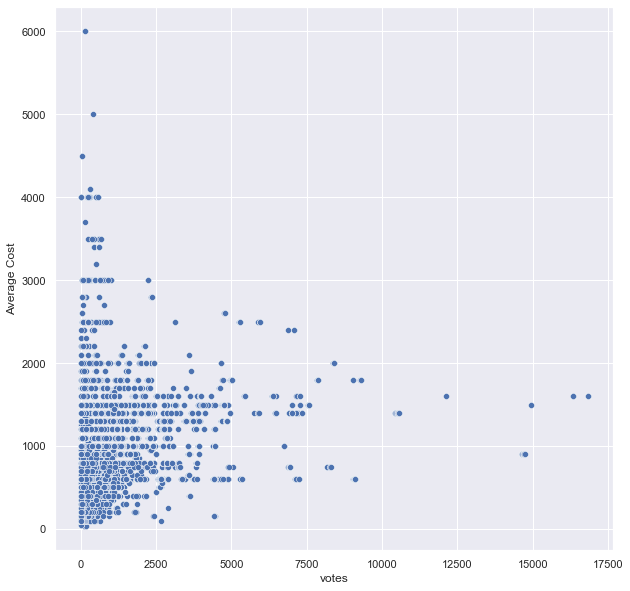

In [86]:
plt.figure(figsize=(10,10))
sns.scatterplot(x=df["votes"],y=df["Average Cost"])

<AxesSubplot:xlabel='rating', ylabel='Average Cost'>

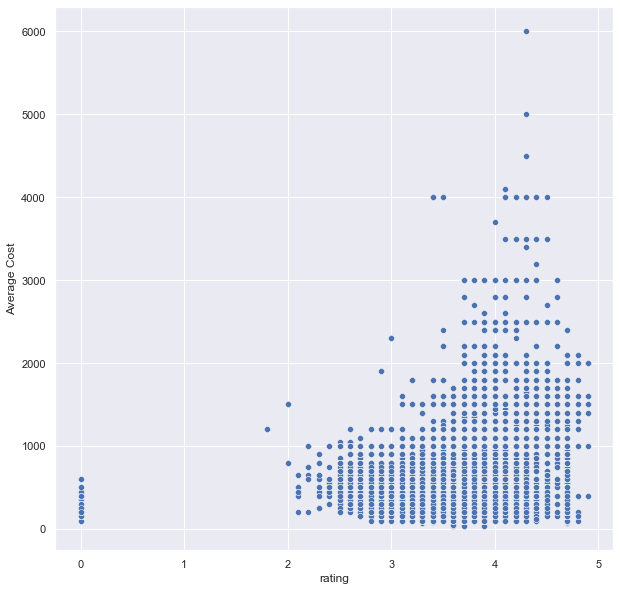

In [87]:
plt.figure(figsize=(10,10))
sns.set()
sns.scatterplot(x=df["rating"],y=df["Average Cost"])

#### We see that for rating above 3 the average cost is high

In [34]:
encoder = LabelEncoder()
df["Cusinies_ID"] = encoder.fit_transform(df["cuisines"])

In [35]:
df.drop("cuisines",axis=1,inplace=True)

In [36]:
df.head()

,online_order,book_table,votes,location,Type of Resturant,Average Cost,Type of Order,City Name,rating,Cusinies_ID
0,Yes,Yes,775,Banashankari,Casual Dining,800.0,Buffet,Banashankari,4.1,2159
1,Yes,No,787,Banashankari,Casual Dining,800.0,Buffet,Banashankari,4.1,952
2,Yes,No,918,Banashankari,"Cafe, Casual Dining",800.0,Buffet,Banashankari,3.8,766
3,No,No,88,Banashankari,Quick Bites,300.0,Buffet,Banashankari,3.7,2555
4,No,No,166,Basavanagudi,Casual Dining,600.0,Buffet,Banashankari,3.8,2188


In [37]:
df["Type of Order"].value_counts()

Delivery              25767
Dine-out              17606
Desserts               3582
Cafes                  1722
Drinks & nightlife     1094
Buffet                  880
Pubs and bars           694
Name: Type of Order, dtype: int64

In [38]:
df["City Name"].value_counts()

BTM                      3249
Koramangala 7th Block    2924
Koramangala 5th Block    2821
Koramangala 4th Block    2771
Koramangala 6th Block    2615
Jayanagar                2360
JP Nagar                 2090
Indiranagar              1849
MG Road                  1803
Church Street            1789
Brigade Road             1768
HSR                      1729
Lavelle Road             1728
Marathahalli             1633
Residency Road           1616
Bannerghatta Road        1604
Whitefield               1584
Brookefield              1508
Old Airport Road         1421
Kammanahalli             1322
Kalyan Nagar             1300
Basavanagudi             1261
Sarjapur Road            1256
Bellandur                1215
Electronic City          1193
Frazer Town              1183
Malleshwaram             1091
Rajajinagar              1066
Banashankari              858
New BEL Road              738
Name: City Name, dtype: int64

In [39]:
df["location"].value_counts()

BTM                              5065
HSR                              2511
Koramangala 5th Block            2502
JP Nagar                         2225
Whitefield                       2101
Indiranagar                      2068
Jayanagar                        1919
Marathahalli                     1817
Bannerghatta Road                1623
Bellandur                        1273
Koramangala 1st Block            1228
Electronic City                  1222
Brigade Road                     1210
Koramangala 7th Block            1179
Koramangala 6th Block            1154
Sarjapur Road                    1062
Ulsoor                           1017
Koramangala 4th Block            1016
MG Road                           917
Banashankari                      899
Kalyan Nagar                      853
Richmond Road                     803
Malleshwaram                      721
Frazer Town                       717
Basavanagudi                      683
Residency Road                    672
Brookefield 

In [40]:
df["Type of Resturant"].value_counts()

Quick Bites                      18881
Casual Dining                    10308
Cafe                              3726
Delivery                          2580
Dessert Parlor                    2256
Takeaway, Delivery                2027
Casual Dining, Bar                1148
Bakery                            1123
Beverage Shop                      865
Bar                                697
Food Court                         621
Sweet Shop                         468
Bar, Casual Dining                 420
Lounge                             395
Pub                                355
Fine Dining                        345
Casual Dining, Cafe                319
Beverage Shop, Quick Bites         298
Bakery, Quick Bites                289
Mess                               267
Pub, Casual Dining                 255
Sweet Shop, Quick Bites            178
Kiosk                              176
Dessert Parlor, Cafe               175
Cafe, Casual Dining                173
Cafe, Bakery             

In [41]:
X = df.drop("Average Cost",axis=1)
y = df["Average Cost"]

In [88]:
x_train,x_valid,y_train,y_valid = train_test_split(X,y,test_size=0.3,random_state=30)

In [89]:
x_train.shape,y_train.shape,x_valid.shape,y_valid.shape

((35941, 9), (35941,), (15404, 9), (15404,))

In [90]:
for i in x_train[["Type of Order","City Name","location","Type of Resturant"]].columns:
    x_train[i] = encoder.fit_transform(x_train[i])
    x_valid[i] = encoder.transform(x_valid[i])

In [91]:
ord_enc = OrdinalEncoder()
x_train[["online_order","book_table"]] = ord_enc.fit_transform(x_train[["online_order","book_table"]])
x_valid[["online_order","book_table"]] = ord_enc.transform(x_valid[["online_order","book_table"]])

In [92]:
x_train.head()

,online_order,book_table,votes,location,Type of Resturant,Type of Order,City Name,rating,Cusinies_ID
39176,0.0,0.0,82,54,27,4,20,3.9,974
24442,1.0,0.0,20,2,78,2,14,3.0,404
27307,1.0,0.0,337,22,78,2,16,3.9,1898
26249,1.0,0.0,0,36,93,4,15,NaN,2377
37170,1.0,0.0,10,0,78,4,19,3.4,282


In [93]:
x_valid.head()

,online_order,book_table,votes,location,Type of Resturant,Type of Order,City Name,rating,Cusinies_ID
18653,0.0,1.0,2785,27,10,4,11,4.6,1027
45402,0.0,0.0,215,27,17,2,25,4.0,1440
47952,0.0,0.0,9,20,40,2,27,3.5,1219
39779,1.0,0.0,6,92,78,2,22,3.1,403
12215,1.0,0.0,158,28,27,2,7,3.9,986


In [98]:
imputer = KNNImputer(n_neighbors=13)
x_train_impute = imputer.fit_transform(x_train)
x_valid_impute = imputer.transform(x_valid)
y_train = imputer.fit_transform(np.array(y_train).reshape(-1, 1))
y_valid = imputer.transform(np.array(y_valid).reshape(-1, 1))

In [99]:
x_train_impute = pd.DataFrame(x_train_impute,columns=x_train.columns)
x_valid_impute = pd.DataFrame(x_valid_impute,columns=x_valid.columns)

In [100]:
x_train_impute.isnull().sum()

online_order         0
book_table           0
votes                0
location             0
Type of Resturant    0
Type of Order        0
City Name            0
rating               0
Cusinies_ID          0
dtype: int64

In [101]:
x_valid_impute.isnull().sum()

online_order         0
book_table           0
votes                0
location             0
Type of Resturant    0
Type of Order        0
City Name            0
rating               0
Cusinies_ID          0
dtype: int64